In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available, please check your installation")


Num GPUs Available:  1
GPU is available


In [3]:
# dataset을 training set과 validation set으로 나누기 8:2비율
batch_size = 32
img_height = 224
img_width = 224

image_directory = './Digital images of defective and good condition tyres'

train_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율 (여기서는 20%를 검증 데이터로 사용)
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='training',  # 훈련 데이터셋을 생성하기 위해 'training' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

class_names=train_data.class_names
print(class_names)

# validation data 만들기
val_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='validation',  # 검증 데이터셋을 생성하기 위해 'validation' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.
['defective', 'good']
Found 1856 files belonging to 2 classes.
Using 371 files for validation.


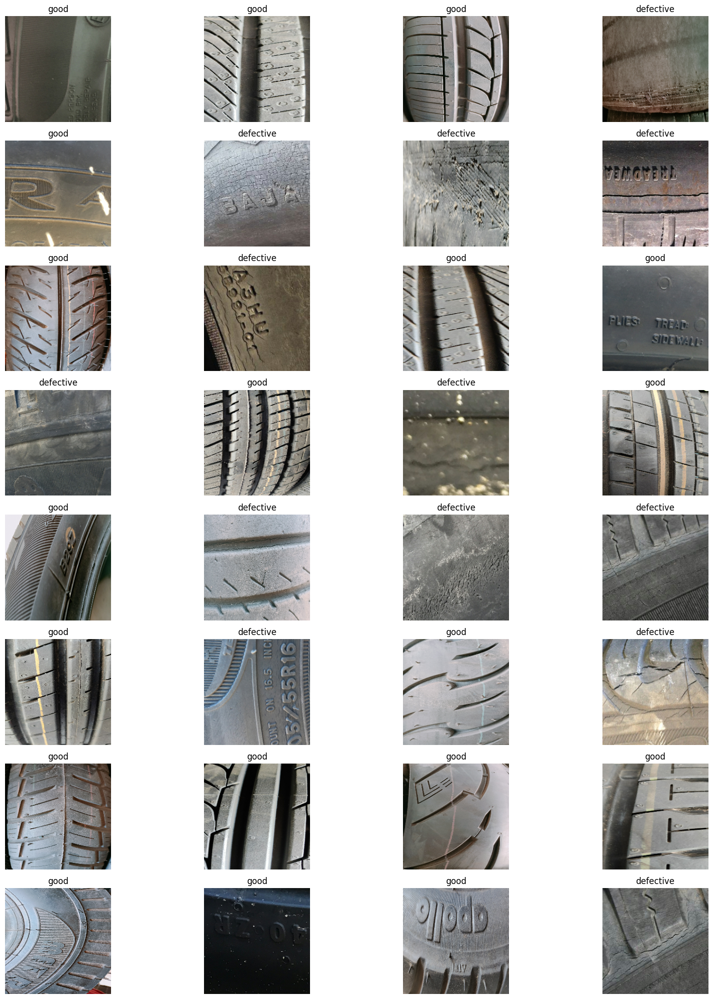

In [4]:
# Plot the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

# 전이 학습을 통한 모델 훈련

In [5]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Reshape, Dense, Multiply, Conv2D, Add, Activation, Input, BatchNormalization, MaxPooling2D
from tensorflow.keras.models import Model

def se_block(input_tensor, reduction=16):
    """ Create a Squeeze and Excitation block
    Args:
        input_tensor: input Keras tensor
        reduction: integer, the reduction ratio
    Returns: a Keras tensor
    """
    channel_axis = 1 if tf.keras.backend.image_data_format() == "channels_first" else -1
    filters = input_tensor.shape[channel_axis]

    se_shape = (1, 1, filters)
    se = GlobalAveragePooling2D()(input_tensor)
    se = Reshape(se_shape)(se)
    se = Dense(filters // reduction, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
    se = Multiply()([input_tensor, se])
    return se

def se_resnet_block(input_tensor, filters, kernel_size=3, stride=1, conv_shortcut=True, name=None):
    """ A residual block.
    Args:
        input_tensor: input Keras tensor
        filters: integer, filters of the bottleneck layer
        kernel_size: default 3, kernel size of the bottleneck layer
        stride: default 1, stride of the first layer
        conv_shortcut: default True, use convolution shortcut if True, otherwise identity shortcut
        name: string, block label
    Returns: output tensor for the block
    """
    if conv_shortcut:
        shortcut = Conv2D(4 * filters, 1, strides=stride, name=name + '_0_conv')(input_tensor)
        shortcut = BatchNormalization(axis=-1, epsilon=1.001e-5, name=name + '_0_bn')(shortcut)
    else:
        shortcut = input_tensor

    x = Conv2D(filters, 1, strides=stride, name=name + '_1_conv')(input_tensor)
    x = BatchNormalization(axis=-1, epsilon=1.001e-5, name=name + '_1_bn')(x)
    x = Activation('relu', name=name + '_1_relu')(x)

    x = Conv2D(filters, kernel_size, padding='SAME', name=name + '_2_conv')(x)
    x = BatchNormalization(axis=-1, epsilon=1.001e-5, name=name + '_2_bn')(x)
    x = Activation('relu', name=name + '_2_relu')(x)

    x = Conv2D(4 * filters, 1, name=name + '_3_conv')(x)
    x = BatchNormalization(axis=-1, epsilon=1.001e-5, name=name + '_3_bn')(x)

    x = se_block(x, reduction=16)

    x = Add(name=name + '_add')([shortcut, x])
    x = Activation('relu', name=name + '_out')(x)
    return x

def se_resnet50(input_shape=(224, 224, 3), num_classes=1):
    """ SENet-50
    """
    img_input = Input(shape=input_shape)
    x = Conv2D(64, 7, strides=2, padding='SAME', name='conv1_conv')(img_input)
    x = BatchNormalization(axis=-1, epsilon=1.001e-5, name='conv1_bn')(x)
    x = Activation('relu', name='conv1_relu')(x)
    x = MaxPooling2D(3, strides=2, name='pool1_pool')(x)

    x = se_resnet_block(x, 64, name='conv2_block1')
    x = se_resnet_block(x, 64, conv_shortcut=False, name='conv2_block2')
    x = se_resnet_block(x, 64, conv_shortcut=False, name='conv2_block3')

    x = se_resnet_block(x, 128, stride=2, name='conv3_block1')
    x = se_resnet_block(x, 128, conv_shortcut=False, name='conv3_block2')
    x = se_resnet_block(x, 128, conv_shortcut=False, name='conv3_block3')
    x = se_resnet_block(x, 128, conv_shortcut=False, name='conv3_block4')

    x = se_resnet_block(x, 256, stride=2, name='conv4_block1')
    x = se_resnet_block(x, 256, conv_shortcut=False, name='conv4_block2')
    x = se_resnet_block(x, 256, conv_shortcut=False, name='conv4_block3')
    x = se_resnet_block(x, 256, conv_shortcut=False, name='conv4_block4')
    x = se_resnet_block(x, 256, conv_shortcut=False, name='conv4_block5')
    x = se_resnet_block(x, 256, conv_shortcut=False, name='conv4_block6')

    x = se_resnet_block(x, 512, stride=2, name='conv5_block1')
    x = se_resnet_block(x, 512, conv_shortcut=False, name='conv5_block2')
    x = se_resnet_block(x, 512, conv_shortcut=False, name='conv5_block3')

    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dense(num_classes, activation='sigmoid', name='fc1000')(x)

    model = Model(img_input, x, name='se_resnet50')
    return model

# 모델 생성
model = se_resnet50()

# 모델 컴파일
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=["accuracy"])

# 콜백 설정
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",   # 성능을 모니터링할 지표, 여기서는 검증 손실을 사용
    patience=2,           # 지정된 에포크 동안 모니터링 지표가 개선되지 않으면 학습률을 조정
    factor=0.5,           # 학습률을 감소시킬 비율, 여기서는 학습률을 50%로 줄임
    min_lr=0.00001,       # 학습률의 최솟값, 이 값 이하로 학습률이 떨어지지 않음
    verbose=1             # 콜백 실행 시 학습률 조정 내용을 출력 (학습률 조정이 있을 때마다 메시지 출력)
)

Early_Stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",           # 모니터링할 지표, 여기서는 검증 손실을 사용
    patience=5,                   # 개선되지 않을 때까지 기다릴 에포크 수(해당 에폭 동안 개선되지 않을 시 종료)
    restore_best_weights=True     # 가장 좋은 모델 가중치를 복원(가장 낮은 검증 손실 보인 모델 가중치로 복원)
)


In [6]:
history = model.fit(
    train_data,                    # 훈련 데이터셋
    epochs=100,                      # 전체 데이터셋을 훈련할 횟수
    validation_data=val_data,      # 검증 데이터셋 (훈련 중 각 에폭이 끝날 때마다 검증 데이터셋으로 모델의 성능 평가)
    callbacks=[Early_Stopping, learning_rate_reduction], # 콜백 함수 목록
    verbose=1                      # 훈련 과정의 상세 출력을 지정 (1: 상세 출력, 0: 출력 없음)
)


Epoch 1/100
47/47 [==============================] - 76s 1s/step - loss: 0.8217 - accuracy: 0.6505 - val_loss: 498.4402 - val_accuracy: 0.5606 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 61s 1s/step - loss: 0.5782 - accuracy: 0.7199 - val_loss: 69.4590 - val_accuracy: 0.5687 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 61s 1s/step - loss: 0.5528 - accuracy: 0.7333 - val_loss: 0.5620 - val_accuracy: 0.7116 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 61s 1s/step - loss: 0.5214 - accuracy: 0.7461 - val_loss: 15.6773 - val_accuracy: 0.4340 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - ETA: 0s - loss: 0.5259 - accuracy: 0.7603
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
47/47 [==============================] - 61s 1s/step - loss: 0.5259 - accuracy: 0.7603 - val_loss: 55.7961 - val_accuracy: 0.4394 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - 61s 1s/step -

In [7]:
model.summary()

Model: "se_resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 64  256         ['conv1_conv[0][0]']             
                                )                                                       

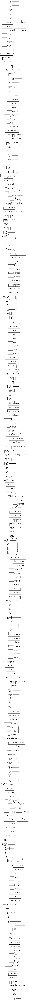

In [8]:
tf.keras.utils.plot_model(
    model,                 # 시각화할 Keras 모델
    show_shapes=True,      # 각 레이어의 출력 형태를 시각화에 포함할지 여부(True: 각 레이어별 출력 텐서 표시)
    show_layer_names=True, # 각 레이어의 이름을 시각화에 포함할지 여부
    show_dtype=True,       # 각 레이어의 데이터 타입을 시각화에 포함할지 여부
    dpi=120                # 시각화 이미지의 해상도 설정 (점 per 인치) (높은 dpi 높은 해상도)
)

In [9]:
import pandas as pd

# history.history 속성을 사용하여 DataFrame 생성
history_dict = history.history
dataframe = pd.DataFrame(history_dict)

# DataFrame 출력
print(dataframe)


       loss  accuracy    val_loss  val_accuracy       lr
0  0.821704  0.650505  498.440247      0.560647  0.00100
1  0.578163  0.719865   69.458977      0.568733  0.00100
2  0.552815  0.733333    0.562042      0.711590  0.00100
3  0.521369  0.746128   15.677323      0.433962  0.00100
4  0.525919  0.760269   55.796089      0.439353  0.00100
5  0.450710  0.786532    1.051636      0.646900  0.00050
6  0.386134  0.816835    3.567299      0.501348  0.00050
7  0.313861  0.868687    3.176255      0.512129  0.00025


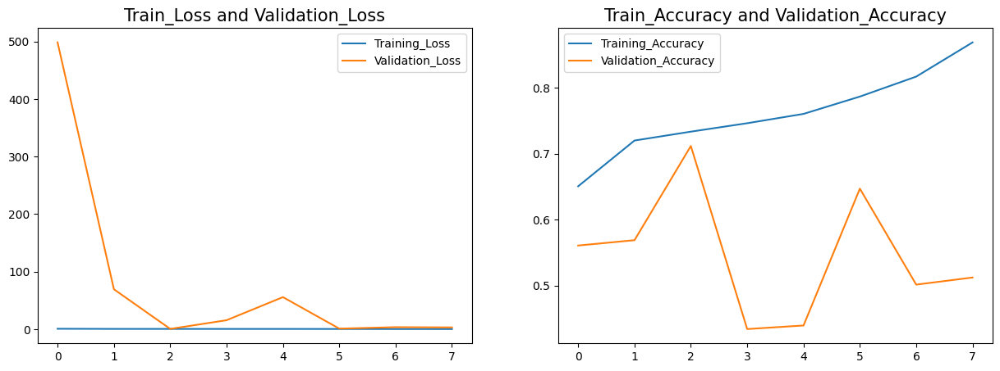

In [10]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [11]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 [==============================] - 5s 336ms/step - loss: 0.5620 - accuracy: 0.7116
Accuracy:0.7115902900695801
Loss:0.5620415210723877


In [12]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())    

In [13]:
# Lets make the Predictions
predictions=model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

12/12 [==============================] - 5s 312ms/step


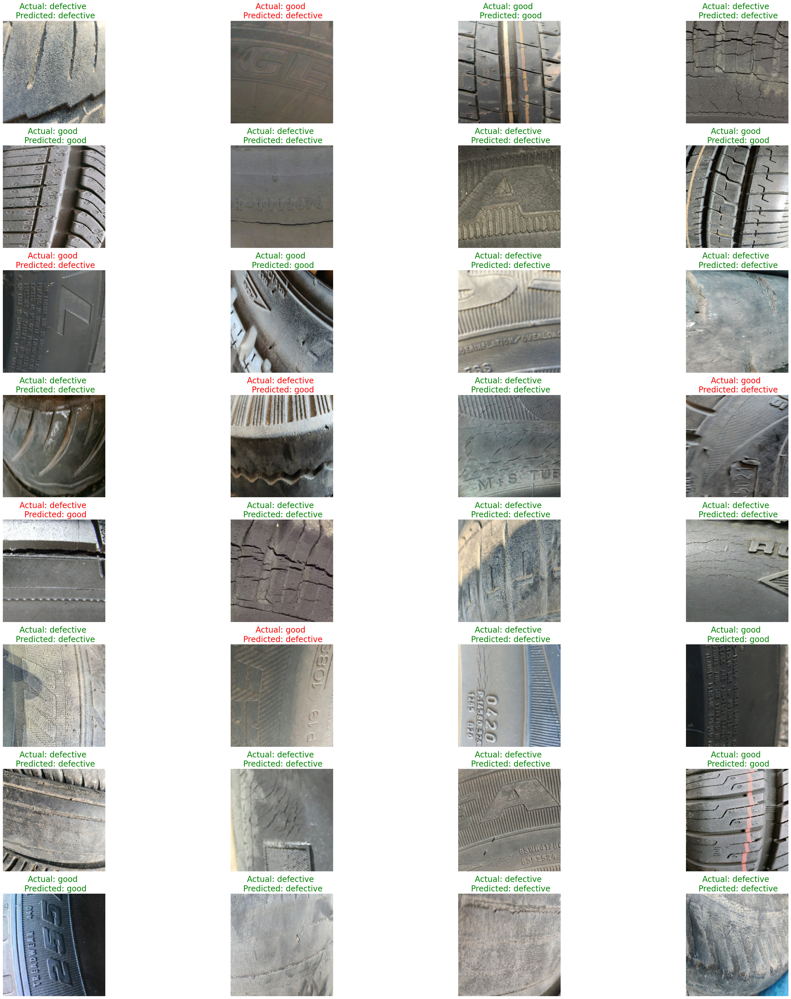

In [14]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

F1-Score:[0.6967773474797009]
Precision:[0.6945134575569358]
Recall:[0.7114358281893004]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.71      0.82      0.76       210
           1       0.71      0.57      0.63       161

    accuracy                           0.71       371
   macro avg       0.71      0.69      0.70       371
weighted avg       0.71      0.71      0.71       371

Confusion_Matrix
----------------------


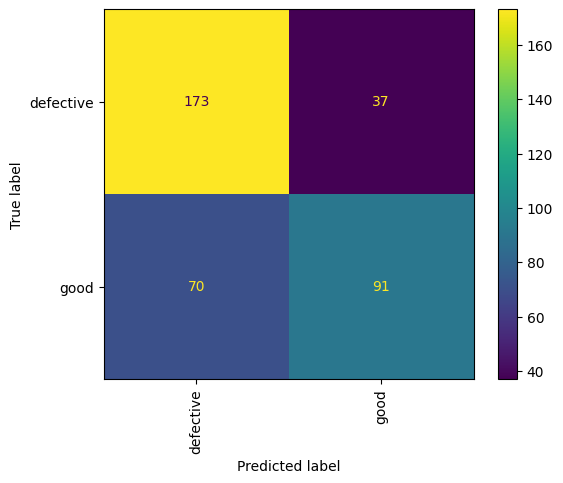

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, ConfusionMatrixDisplay

f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")



print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()


In [16]:
model_name=["SE-ResNet50"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="SE-ResNet50", ascending=False)
result_df

,SE-ResNet50
Recall_Score,0.711436
F1_Score,0.696777
Precision_Score,0.694513


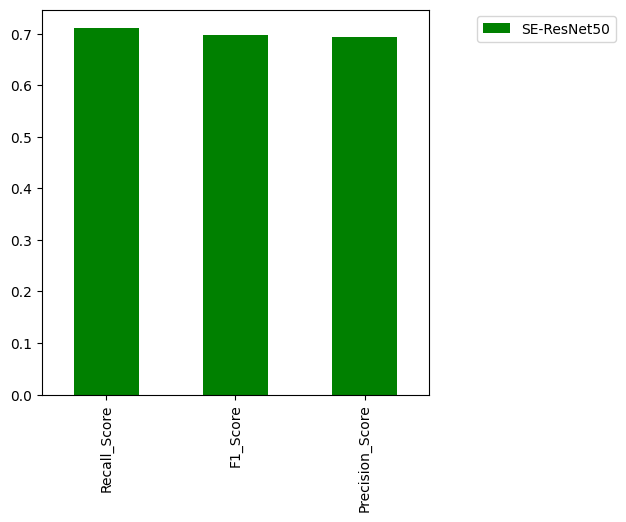

In [17]:
result_df.plot(kind="bar",figsize=(5,5), color="Green").legend(bbox_to_anchor=(1.5,1))